# Live Cancer Prediction

In [ ]:
# Project Name: Liver Cancer Prediction
# Author: Yash Hooda
# Date Created: 02/07/2025
# Dataset can be found at https://www.kaggle.com/datasets/ankushpanday1/liver-cancer-predictions?resource=download
# This dataset contains information about liver cancer predictions in the 30 most populated countries.
# It includes factors such as age, gender, alcohol use, healthcare access, and screening availability.
# The data helps understand how liver cancer spreads, which groups are at higher risk, and how healthcare differences affect survival chances.

In [ ]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries to help with Machine Learning and Classification
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
import shap
from scipy.stats import chi2_contingency

# Command to tell Python to actually display the graphs
%matplotlib inline

In [ ]:
#Load the Dataset

cancer = pd.read_csv("/content/liver_cancer_prediction.csv")

In [ ]:
# Display first 5 rows of dataset
cancer.head()

,Country,Region,Population,Incidence_Rate,Mortality_Rate,Gender,Age,Alcohol_Consumption,Smoking_Status,Hepatitis_B_Status,...,Herbal_Medicine_Use,Healthcare_Access,Screening_Availability,Treatment_Availability,Liver_Transplant_Access,Ethnicity,Preventive_Care,Survival_Rate,Cost_of_Treatment,Prediction
0,Nigeria,Sub-Saharan Africa,340672131,15.381360,6.160480,Male,81,Low,Smoker,Negative,...,No,Poor,Available,Available,No,Hispanic,Good,17.724793,47486.167423,Yes
1,United Kingdom,Europe,1054632817,3.306101,14.392985,Male,87,Low,Smoker,Negative,...,Yes,Good,Available,Not Available,No,Mixed,Moderate,19.558853,13782.265151,No
2,India,South Asia,751241440,9.325053,12.777878,Male,34,Moderate,Smoker,Negative,...,No,Good,Not Available,Not Available,No,Mixed,Moderate,68.468892,25308.034132,No
3,Colombia,South America,1167333367,9.399658,8.634609,Male,63,Low,Non-Smoker,Positive,...,No,Good,Not Available,Not Available,Yes,Hispanic,Moderate,18.200287,38221.622202,No
4,Iran,Middle East,1082070787,9.665663,12.422518,Male,85,High,Non-Smoker,Positive,...,Yes,Moderate,Available,Available,Yes,Mixed,Moderate,45.019153,26765.301404,No


In [ ]:
# Understand the shape of the dataset
cancer.shape

(160292, 25)

In [ ]:
# Checking the data types of the columns for the dataset
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160292 entries, 0 to 160291
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Country                  160292 non-null  object 
 1   Region                   160292 non-null  object 
 2   Population               160292 non-null  int64  
 3   Incidence_Rate           160292 non-null  float64
 4   Mortality_Rate           160292 non-null  float64
 5   Gender                   160292 non-null  object 
 6   Age                      160292 non-null  int64  
 7   Alcohol_Consumption      160292 non-null  object 
 8   Smoking_Status           160292 non-null  object 
 9   Hepatitis_B_Status       160292 non-null  object 
 10  Hepatitis_C_Status       160292 non-null  object 
 11  Obesity                  160292 non-null  object 
 12  Diabetes                 160292 non-null  object 
 13  Rural_or_Urban           160292 non-null  object 
 14  Seaf

In [ ]:
cancer.describe()

,Population,Incidence_Rate,Mortality_Rate,Age,Survival_Rate,Cost_of_Treatment
count,1.602920e+05,160292.000000,160292.000000,160292.000000,160292.000000,160292.000000
mean,7.527321e+08,18.523468,15.525234,54.640088,49.957811,25275.608904
std,4.328283e+08,9.513400,8.376871,20.188217,23.036437,14307.105453
min,1.011968e+06,2.000035,1.000080,20.000000,10.000548,500.397303
25%,3.772400e+08,10.319582,8.286968,37.000000,30.129577,12858.138774
50%,7.548388e+08,18.529822,15.565488,55.000000,49.858143,25349.819261
75%,1.126721e+09,26.751354,22.808666,72.000000,69.833652,37672.515875
max,1.499993e+09,34.999952,29.999829,89.000000,89.998005,49999.791824


Exploratory Data Analysis (EDA)

<Axes: xlabel='Incidence_Rate'>

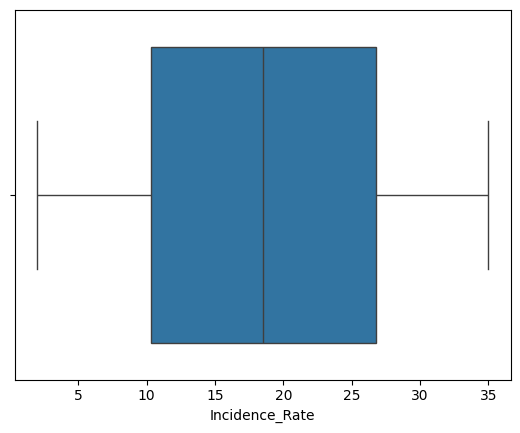

In [ ]:
#Exploratory Data Analysis
sns.boxplot(data=cancer, x='Incidence_Rate')

<Axes: xlabel='Mortality_Rate'>

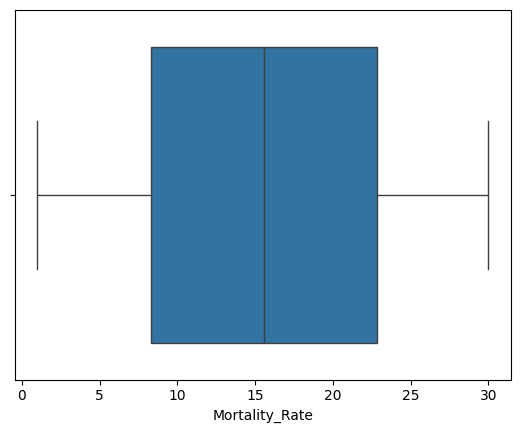

In [ ]:
sns.boxplot(data=cancer, x='Mortality_Rate')

<Axes: xlabel='Survival_Rate'>

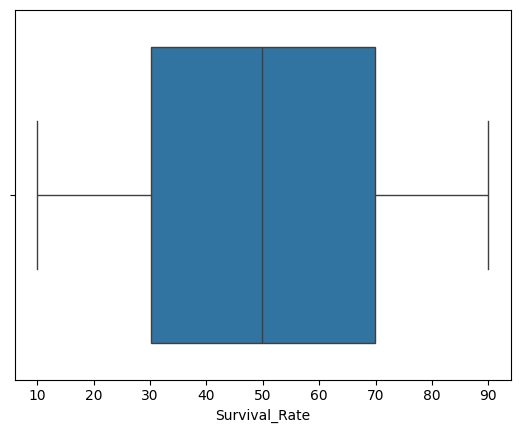

In [ ]:
sns.boxplot(data=cancer, x='Survival_Rate')

<Axes: xlabel='Cost_of_Treatment'>

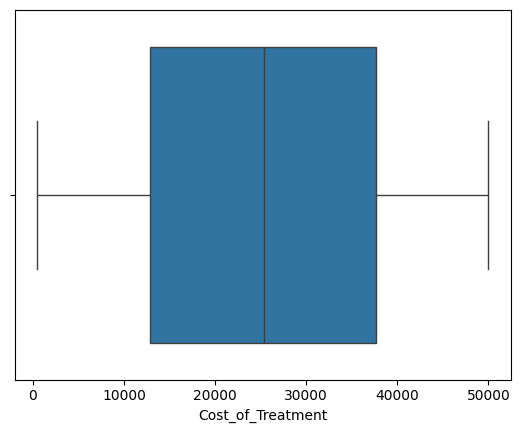

In [ ]:
sns.boxplot(data=cancer, x='Cost_of_Treatment')

<Axes: xlabel='Alcohol_Consumption', ylabel='count'>

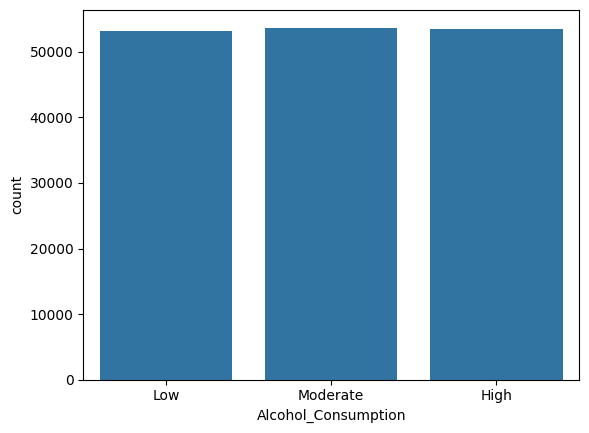

In [ ]:
sns.countplot(data=cancer, x='Alcohol_Consumption')

<Axes: xlabel='Smoking_Status', ylabel='count'>

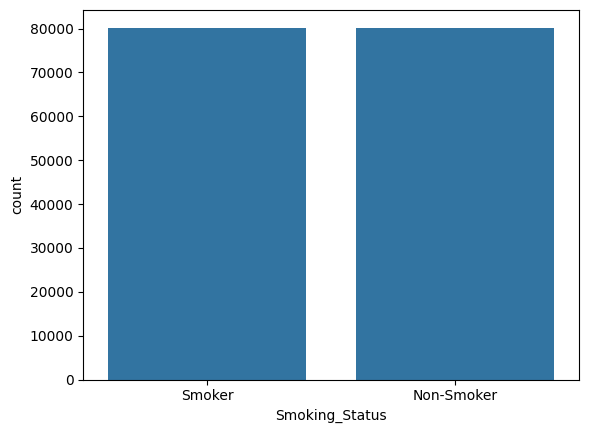

In [ ]:
sns.countplot(data=cancer, x='Smoking_Status')

<Axes: xlabel='Alcohol_Consumption', ylabel='count'>

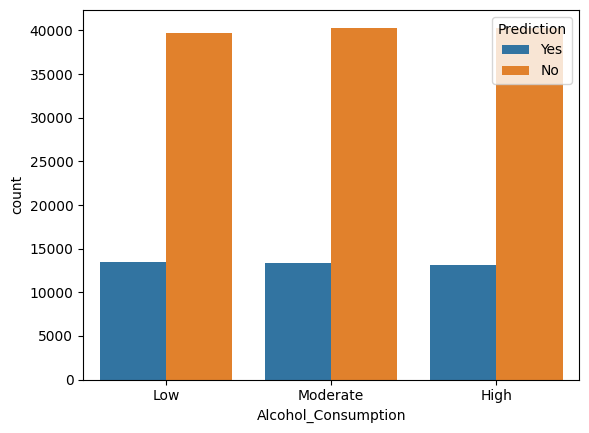

In [ ]:
sns.countplot(data=cancer, x='Alcohol_Consumption', hue='Prediction')

<Axes: xlabel='Smoking_Status', ylabel='count'>

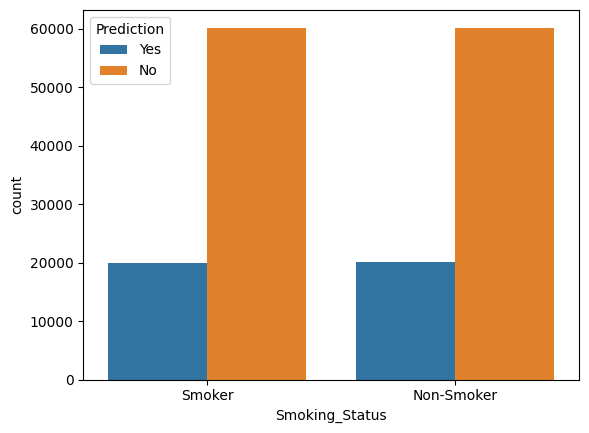

In [ ]:
sns.countplot(data=cancer, x='Smoking_Status', hue='Prediction')

<Axes: xlabel='Hepatitis_B_Status', ylabel='count'>

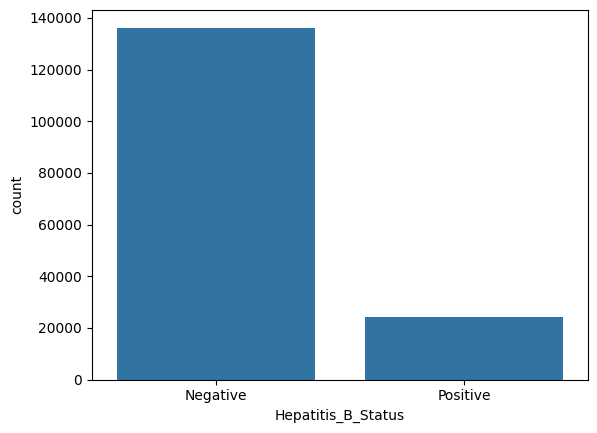

In [ ]:
sns.countplot(data=cancer, x='Hepatitis_B_Status')

<Axes: xlabel='Hepatitis_B_Status', ylabel='count'>

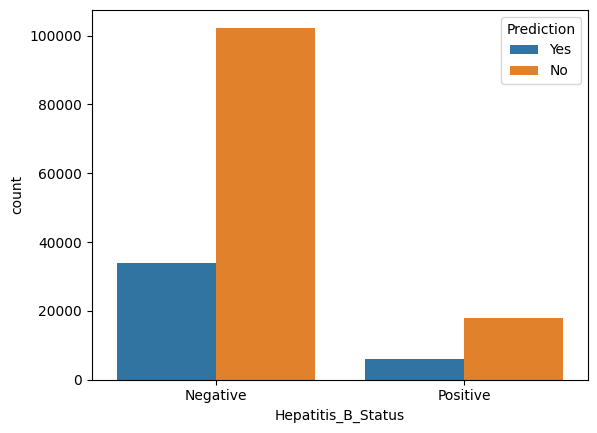

In [ ]:
sns.countplot(data=cancer, x='Hepatitis_B_Status', hue='Prediction')

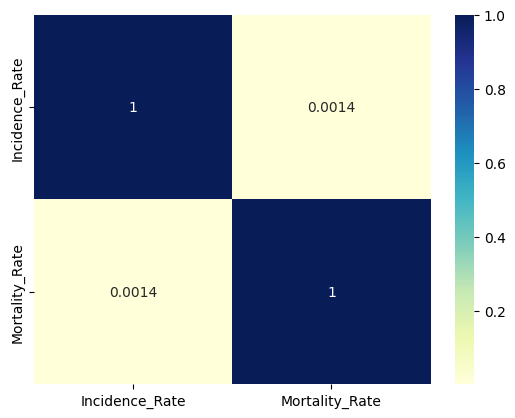

In [ ]:
sns.heatmap(data=cancer[['Incidence_Rate','Mortality_Rate']].corr(), annot=True, cmap='YlGnBu');

# Data Cleaning & Preprocessing
We check for missing values, drop unnecessary columns, and encode categorical variables.

In [ ]:
# Check for missing values
print("Missing values per column:")
print(cancer.isnull().sum())

# Convert categorical variables into numerical encoding
categorical_cols = cancer.select_dtypes(include=['object']).columns
cancer_encoded = pd.get_dummies(cancer, columns=categorical_cols, drop_first=True)

# Display cleaned dataset info
cancer_encoded.info()


Missing values per column:
Country                    0
Region                     0
Population                 0
Incidence_Rate             0
Mortality_Rate             0
Gender                     0
Age                        0
Alcohol_Consumption        0
Smoking_Status             0
Hepatitis_B_Status         0
Hepatitis_C_Status         0
Obesity                    0
Diabetes                   0
Rural_or_Urban             0
Seafood_Consumption        0
Herbal_Medicine_Use        0
Healthcare_Access          0
Screening_Availability     0
Treatment_Availability     0
Liver_Transplant_Access    0
Ethnicity                  0
Preventive_Care            0
Survival_Rate              0
Cost_of_Treatment          0
Prediction                 0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160292 entries, 0 to 160291
Data columns (total 70 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                -------------

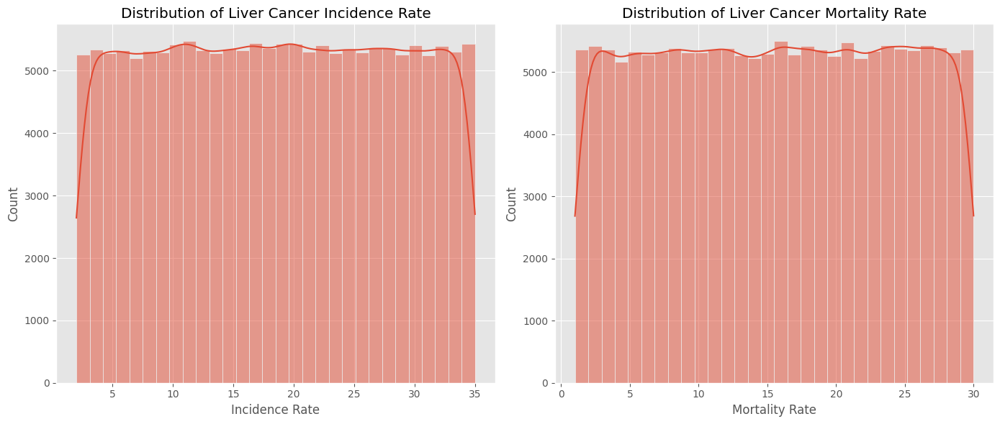

In [ ]:
# Set up plot style
plt.style.use("ggplot")

# Distribution of Incidence and Mortality Rates
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(cancer["Incidence_Rate"], bins=30, kde=True, ax=axes[0])
axes[0].set_title("Distribution of Liver Cancer Incidence Rate")
axes[0].set_xlabel("Incidence Rate")

sns.histplot(cancer["Mortality_Rate"], bins=30, kde=True, ax=axes[1])
axes[1].set_title("Distribution of Liver Cancer Mortality Rate")
axes[1].set_xlabel("Mortality Rate")

plt.tight_layout()
plt.show()

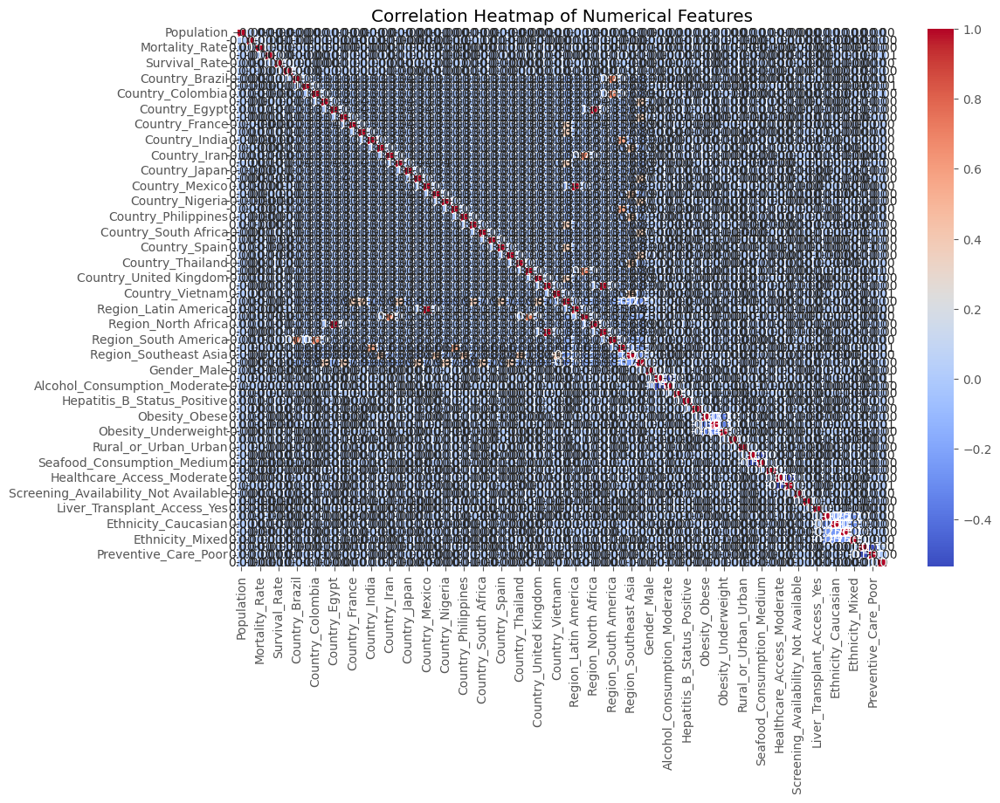

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(cancer_encoded.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

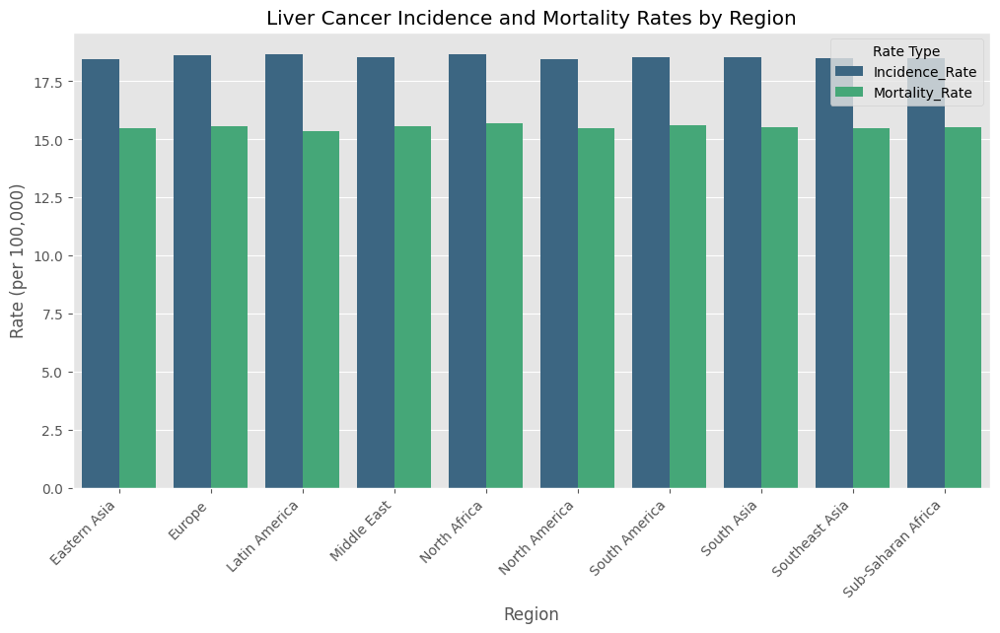

In [ ]:
# Aggregate data by region
region_data = cancer.groupby("Region")[["Incidence_Rate", "Mortality_Rate"]].mean().reset_index()

# Barplot of Incidence and Mortality Rates by Region
plt.figure(figsize=(12, 6))
sns.barplot(data=region_data.melt(id_vars="Region", var_name="Rate Type", value_name="Rate"),
            x="Region", y="Rate", hue="Rate Type", palette="viridis")

plt.xticks(rotation=45, ha="right")
plt.title("Liver Cancer Incidence and Mortality Rates by Region")
plt.ylabel("Rate (per 100,000)")
plt.xlabel("Region")
plt.legend(title="Rate Type")
plt.show()


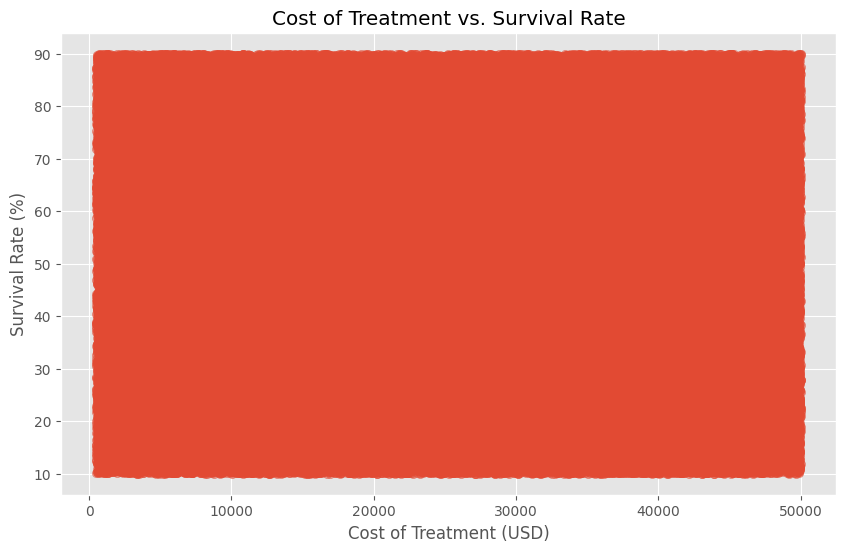

In [ ]:
# Scatter plot of Cost of Treatment vs. Survival Rate
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cancer, x="Cost_of_Treatment", y="Survival_Rate", alpha=0.5, edgecolor=None)
plt.title("Cost of Treatment vs. Survival Rate")
plt.xlabel("Cost of Treatment (USD)")
plt.ylabel("Survival Rate (%)")
plt.show()

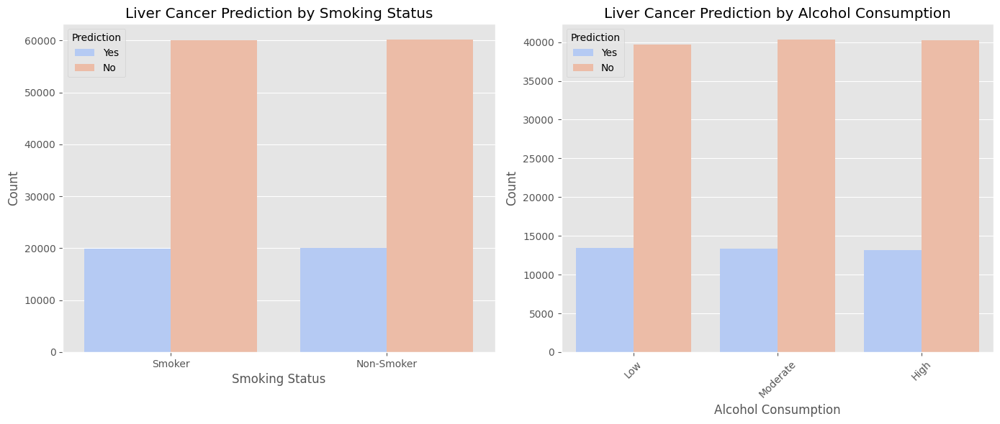

In [ ]:

# Countplot for Smoking and Alcohol impact on Liver Cancer Prediction
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(data=cancer, x="Smoking_Status", hue="Prediction", ax=axes[0], palette="coolwarm")
axes[0].set_title("Liver Cancer Prediction by Smoking Status")
axes[0].set_xlabel("Smoking Status")
axes[0].set_ylabel("Count")

sns.countplot(data=cancer, x="Alcohol_Consumption", hue="Prediction", ax=axes[1], palette="coolwarm")
axes[1].set_title("Liver Cancer Prediction by Alcohol Consumption")
axes[1].set_xlabel("Alcohol Consumption")
axes[1].set_ylabel("Count")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


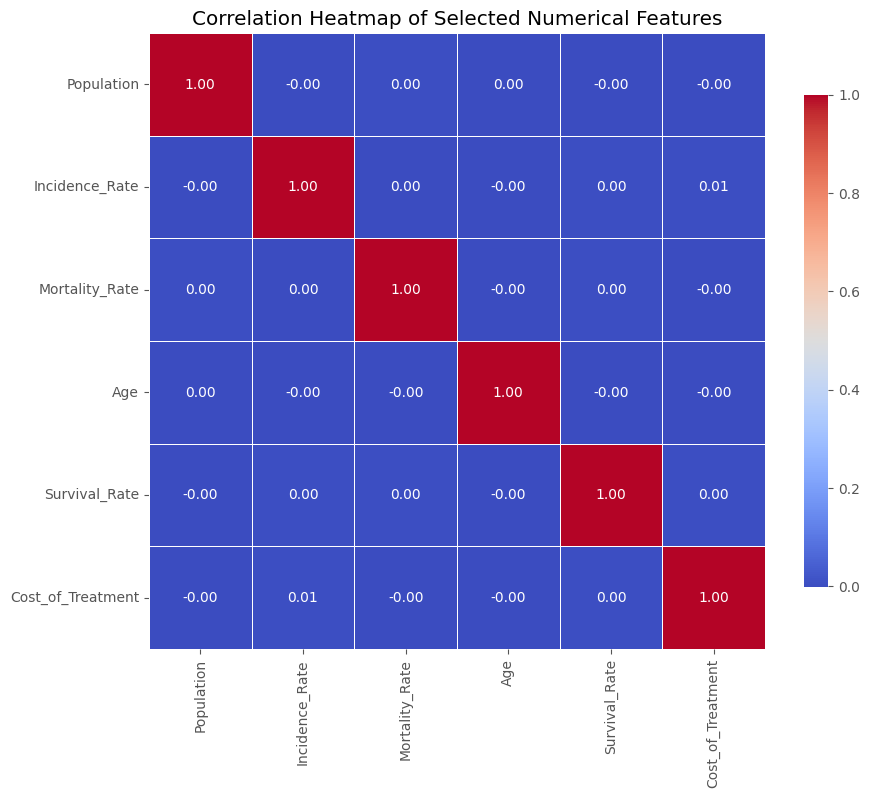

In [ ]:
# Select only the relevant columns for the heatmap
selected_columns = [
    "Population",
    "Incidence_Rate",
    "Mortality_Rate",
    "Age",
    "Survival_Rate",
    "Cost_of_Treatment"
]
corr_matrix = cancer_encoded[selected_columns].corr()

# Set up the figure size
plt.figure(figsize=(10, 8))

# Generate the heatmap with boxes
sns.heatmap(
    corr_matrix,
    annot=True,             # Display correlation values
    cmap="coolwarm",        # Use a red-blue color scheme
    fmt=".2f",              # Format values to 2 decimal places
    linewidths=0.5,         # Add line widths between cells
    square=True,            # Make each cell a square
    cbar_kws={"shrink": 0.8}  # Shrink color bar for better fit
)

# Set the title
plt.title("Correlation Heatmap of Selected Numerical Features")

# Show the plot
plt.show()

# 2. Geographical Insights
A choropleth map of Incidence_Rate and Mortality_Rate by Country/Region to showcase the geographical distribution.

In [ ]:
# Geographical Insights: Choropleth Maps
fig1 = px.choropleth(cancer, locations="Country", locationmode="country names",
                     color="Incidence_Rate", hover_name="Country",
                     title="Incidence Rate of Liver Cancer by Country",
                     color_continuous_scale="Reds")
fig1.show()

fig2 = px.choropleth(cancer, locations="Country", locationmode="country names",
                     color="Mortality_Rate", hover_name="Country",
                     title="Mortality Rate of Liver Cancer by Country",
                     color_continuous_scale="Blues")
fig2.show()

# 3. Key Insights & Hypothesis Testing

<ipython-input-29-12af1eabc402>:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-29-12af1eabc402>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-29-12af1eabc402>:5: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-29-12af1eabc402>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-29-12af1eabc402>:7: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-29-12af1eabc402>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `h

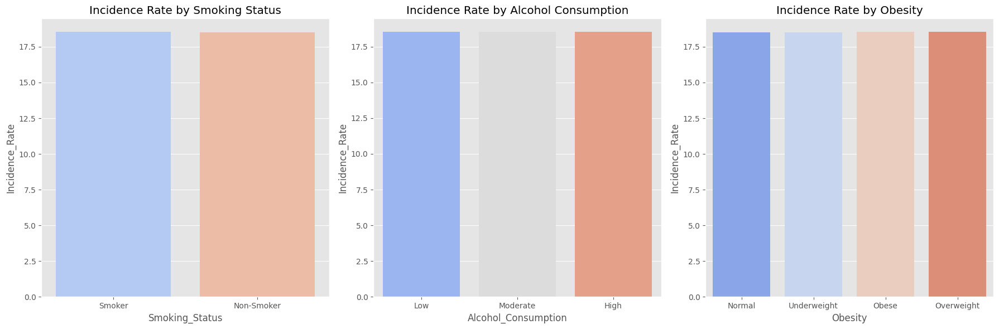

Chi-Square Test: p-value = 0.6881
Smoking_Status does not significantly impact the Prediction.


In [ ]:
# Risk Factors for Liver Cancer
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.barplot(data=cancer, x="Smoking_Status", y="Incidence_Rate", ax=axes[0], ci=None, palette="coolwarm")
axes[0].set_title("Incidence Rate by Smoking Status")
sns.barplot(data=cancer, x="Alcohol_Consumption", y="Incidence_Rate", ax=axes[1], ci=None, palette="coolwarm")
axes[1].set_title("Incidence Rate by Alcohol Consumption")
sns.barplot(data=cancer, x="Obesity", y="Incidence_Rate", ax=axes[2], ci=None, palette="coolwarm")
axes[2].set_title("Incidence Rate by Obesity")
plt.tight_layout()
plt.show()

# Chi-Square Test for Smoking_Status
contingency_table = pd.crosstab(cancer["Smoking_Status"], cancer["Prediction"])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test: p-value = {p:.4f}")
if p < 0.05:
    print("Smoking_Status significantly impacts the Prediction.")
else:
    print("Smoking_Status does not significantly impact the Prediction.")

#4. Healthcare & Survival Analysis
Visualize Survival_Rate across healthcare-related categories:

<ipython-input-30-4aaa0ad0b91a>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-30-4aaa0ad0b91a>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-30-4aaa0ad0b91a>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




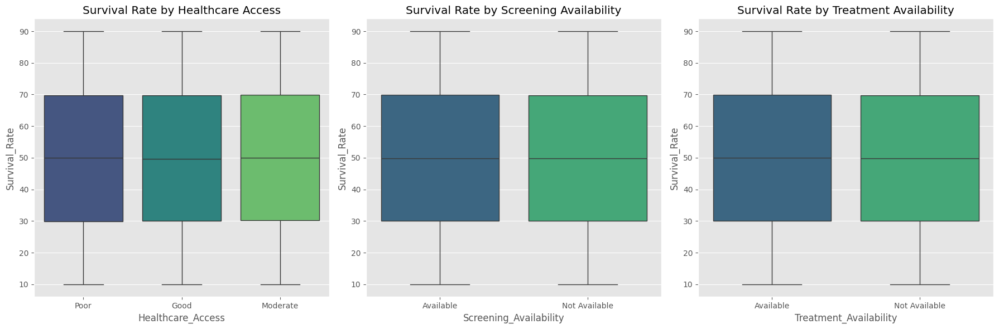

In [ ]:
# Boxplots for Survival Rate
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.boxplot(data=cancer, x="Healthcare_Access", y="Survival_Rate", ax=axes[0], palette="viridis")
axes[0].set_title("Survival Rate by Healthcare Access")
sns.boxplot(data=cancer, x="Screening_Availability", y="Survival_Rate", ax=axes[1], palette="viridis")
axes[1].set_title("Survival Rate by Screening Availability")
sns.boxplot(data=cancer, x="Treatment_Availability", y="Survival_Rate", ax=axes[2], palette="viridis")
axes[2].set_title("Survival Rate by Treatment Availability")
plt.tight_layout()
plt.show()


# 5. Cost Analysis
Analyze the relationship between Cost_of_Treatment and Survival_Rate using scatter and boxplots:

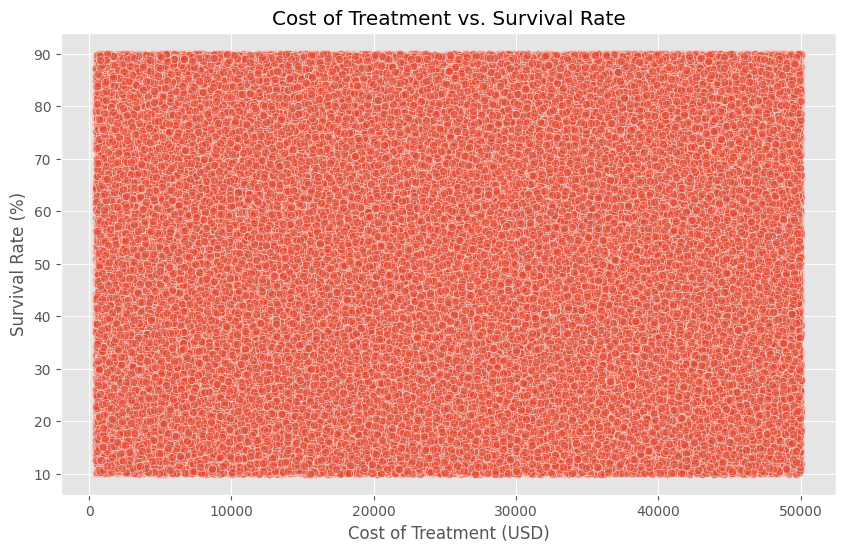

<ipython-input-31-7c61a21f2bfe>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




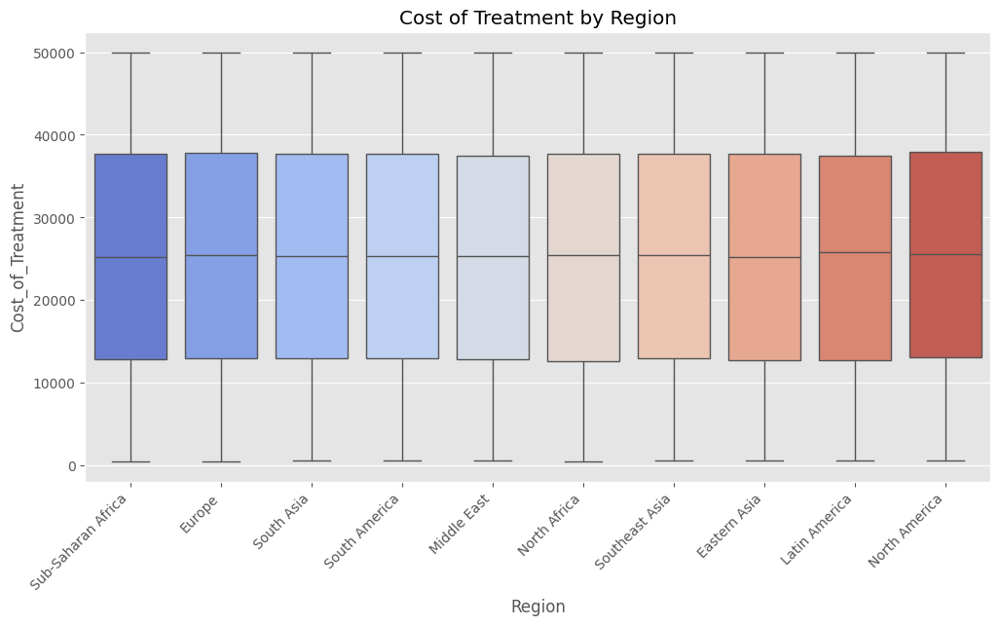

In [ ]:
# Scatterplot: Cost of Treatment vs. Survival Rate
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cancer, x="Cost_of_Treatment", y="Survival_Rate", alpha=0.5)
plt.title("Cost of Treatment vs. Survival Rate")
plt.xlabel("Cost of Treatment (USD)")
plt.ylabel("Survival Rate (%)")
plt.show()

# Boxplot: Cost of Treatment by Region
plt.figure(figsize=(12, 6))
sns.boxplot(data=cancer, x="Region", y="Cost_of_Treatment", palette="coolwarm")
plt.title("Cost of Treatment by Region")
plt.xticks(rotation=45, ha="right")
plt.show()


# 6. Machine Learning & Explainability
Train a Logistic Regression model, evaluate it, and visualize results:

Confusion Matrix:
[[24146     0]
 [ 7913     0]]

Classification Report:
              precision    recall  f1-score   support

       False       0.75      1.00      0.86     24146
        True       0.00      0.00      0.00      7913

    accuracy                           0.75     32059
   macro avg       0.38      0.50      0.43     32059
weighted avg       0.57      0.75      0.65     32059



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



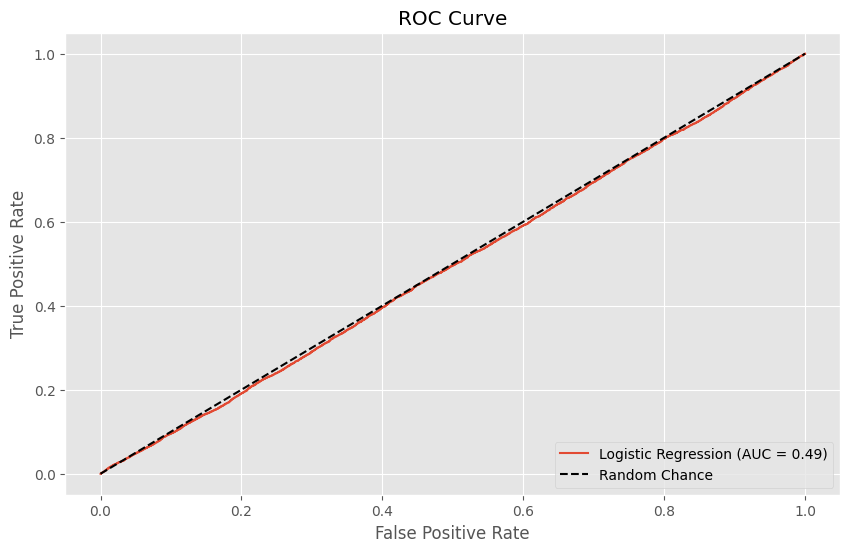

In [ ]:
# Split the data into train and test sets
X = cancer_encoded.drop(columns=["Prediction_Yes"])
y = cancer_encoded["Prediction_Yes"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Logistic Regression Model
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)

# Evaluate the Model
y_pred = lr_model.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# ROC Curve
y_prob = lr_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f"Logistic Regression (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], "k--", label="Random Chance")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

# Machine Learning Model
We train a Random Forest Classifier to predict liver cancer risk.

In [ ]:
# Define features and target variable
X = cancer_encoded.drop(columns=["Prediction_Yes"])
y = cancer_encoded["Prediction_Yes"]

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest Model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred = rf_model.predict(X_test)

# Model Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:", confusion_matrix(y_test, y_pred))
print("Classification Report:", classification_report(y_test, y_pred))


Accuracy: 0.7530802582738076
Confusion Matrix: [[24143     3]
 [ 7913     0]]
Classification Report:               precision    recall  f1-score   support

       False       0.75      1.00      0.86     24146
        True       0.00      0.00      0.00      7913

    accuracy                           0.75     32059
   macro avg       0.38      0.50      0.43     32059
weighted avg       0.57      0.75      0.65     32059



TypeError: loop of ufunc does not support argument 0 of type float which has no callable rint method

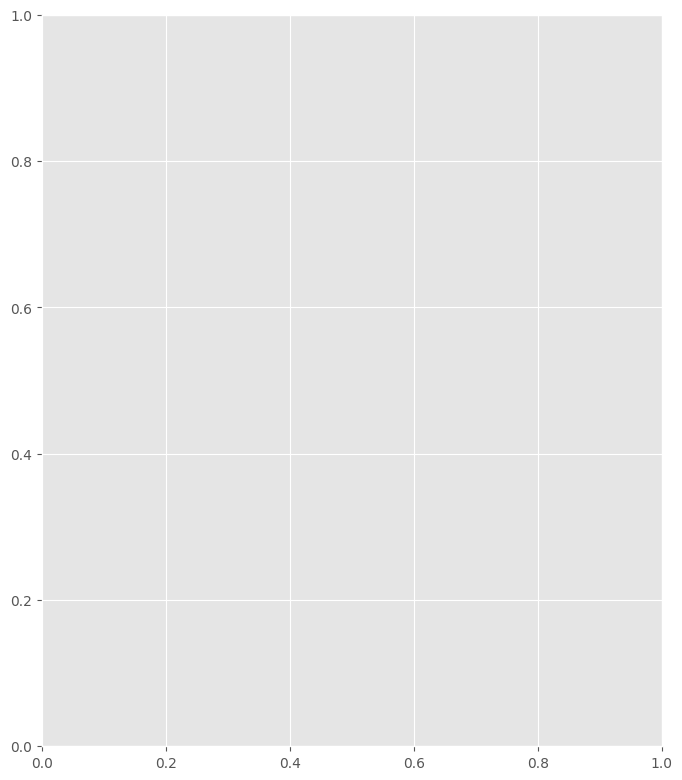

In [ ]:
# SHAP Feature Importance
explainer = shap.Explainer(lr_model, X_test)
shap_values = explainer(X_test)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_test)